In [70]:

import os
from tensorflow.keras.models import load_model
import pickle
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

from tensorflow.keras.layers import LSTM, Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import mean_squared_error, accuracy_score, classification_report
import math
import time
import matplotlib.pyplot as plt
# General-purpose imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# For CNN
from tensorflow.keras.models import Sequential




In [71]:
from google.colab import files
files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle (1).json


In [74]:
# !kaggle datasets download -d pavansanagapati/images-dataset/cod
!kaggle datasets download -d pavansanagapati/images-dataset



Dataset URL: https://www.kaggle.com/datasets/pavansanagapati/images-dataset
License(s): CC0-1.0
images-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


In [76]:
!unzip images-dataset.zip -d images_dataset_new


Archive:  images-dataset.zip
replace images_dataset_new/data/bike/bike_001.bmp? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
!ls images_dataset_new


data


In [ ]:
import os
import pandas as pd

# Define the path to the main dataset folder
dataset_path = 'images_dataset_new/data'  # Update with your dataset path
csv_output_path = 'image_data.csv'

# Initialize a list to store image paths and labels
image_data = []

# Loop through each directory in the dataset path
for class_label in os.listdir(dataset_path):
    class_dir = os.path.join(dataset_path, class_label)

    if os.path.isdir(class_dir):  # Ensure we're looking at a directory
        # Loop through each image in the class directory
        for image_file in os.listdir(class_dir):
            image_path = os.path.join(class_dir, image_file)
            # Append the image path and label to the list
            image_data.append((image_path, class_label))

# Convert the list to a DataFrame
df = pd.DataFrame(image_data, columns=['image_path', 'label'])

# Save the DataFrame to a CSV file
df.to_csv(csv_output_path, index=False)

print(f"CSV file has been created at {csv_output_path}")


CSV file has been created at image_data.csv


In [77]:
Df=pd.read_csv('image_data.csv')
Df

,image_path,label
0,images_dataset_new/data/human/rider-23.jpg,human
1,images_dataset_new/data/human/rider-176.jpg,human
2,images_dataset_new/data/human/rider-104.jpg,human
3,images_dataset_new/data/human/rider-140.jpg,human
4,images_dataset_new/data/human/rider-167.jpg,human
...,...,...
1805,images_dataset_new/data/dogs/dog.90.jpg,dogs
1806,images_dataset_new/data/dogs/dog.154.jpg,dogs
1807,images_dataset_new/data/dogs/dog.168.jpg,dogs
1808,images_dataset_new/data/dogs/dog.23.jpg,dogs


Displaying images for class: human


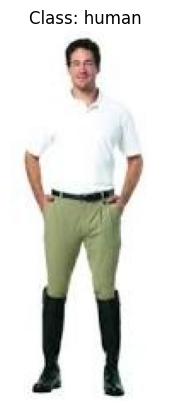

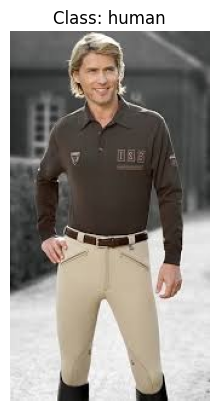

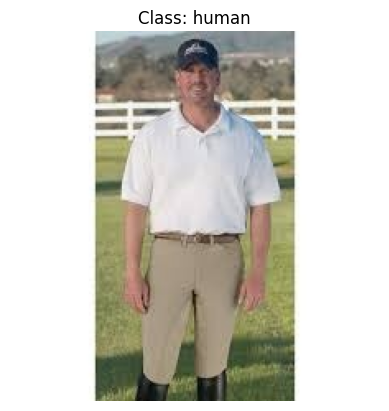

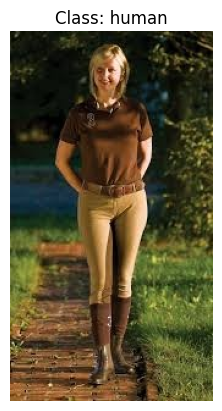

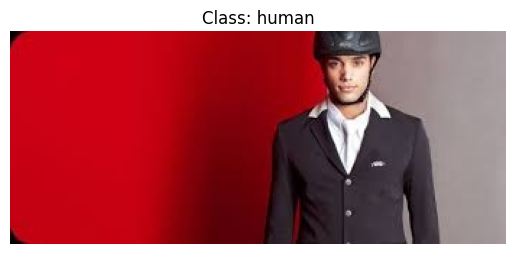

Displaying images for class: data
Displaying images for class: cars


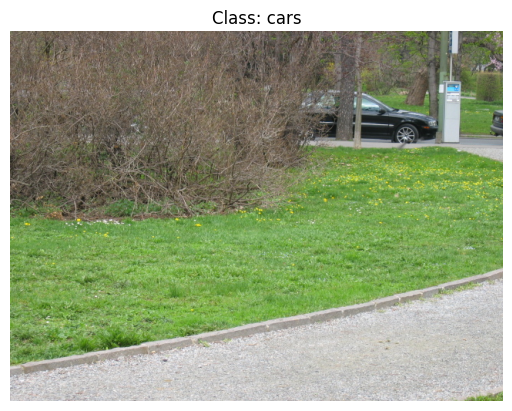

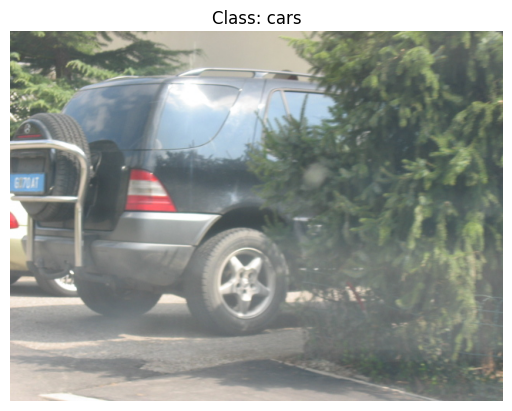

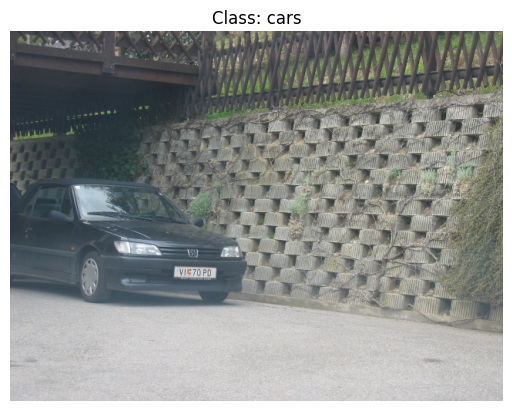

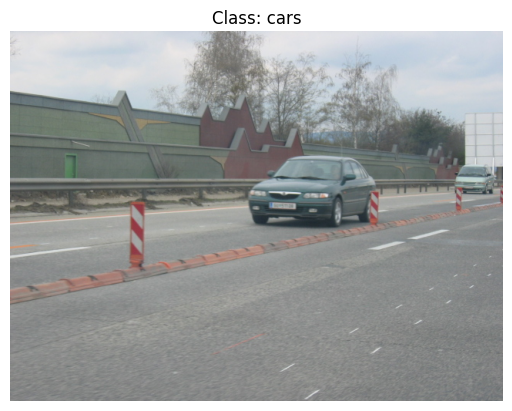

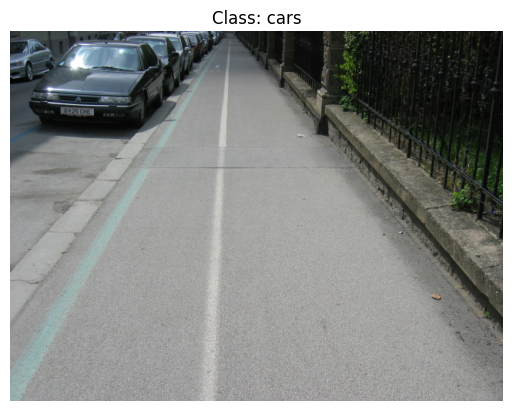

Displaying images for class: bike


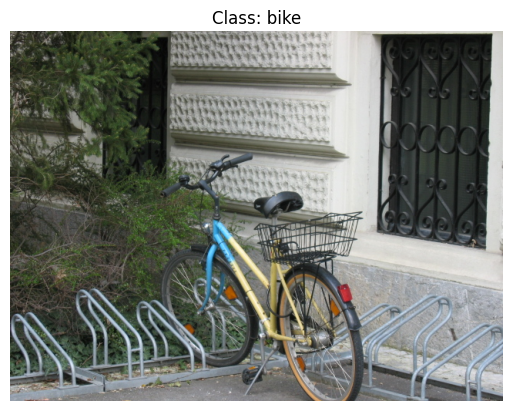

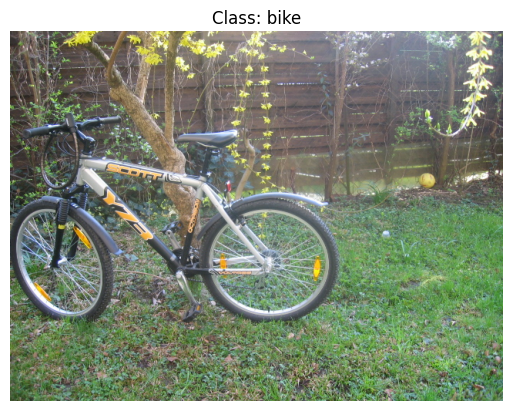

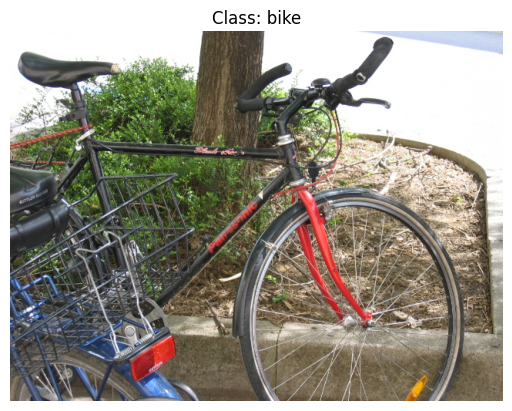

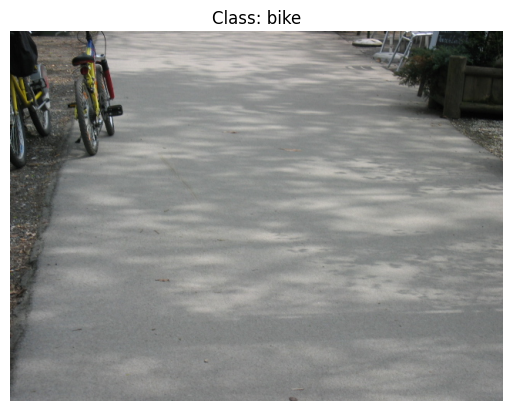

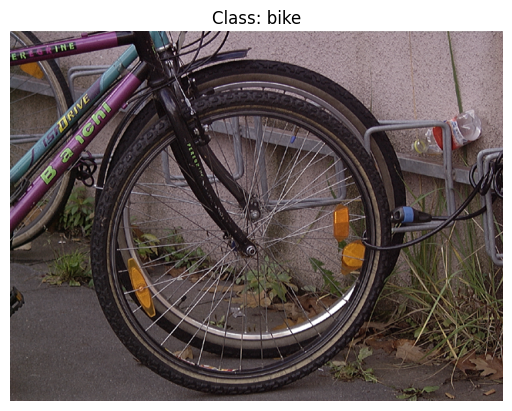

Displaying images for class: flowers


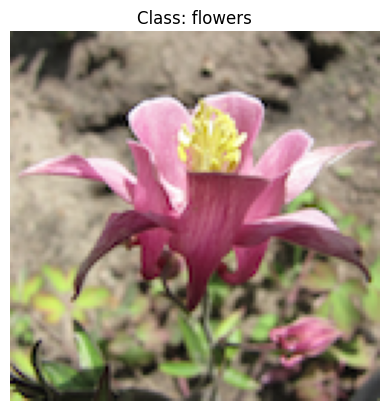

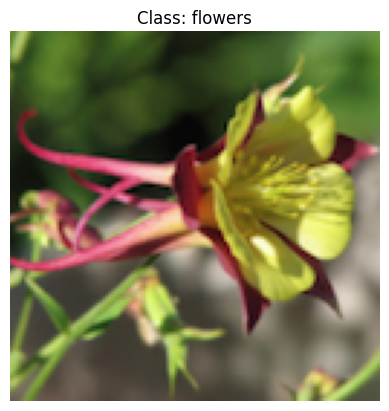

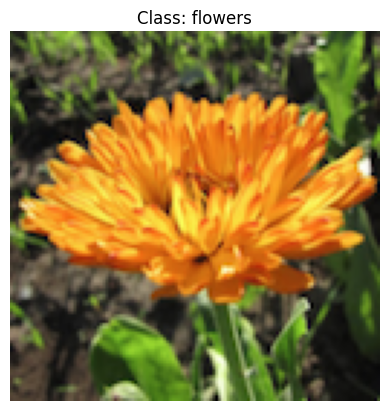

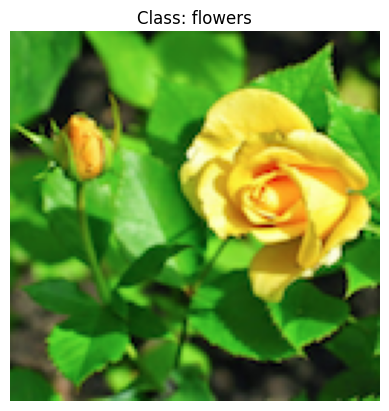

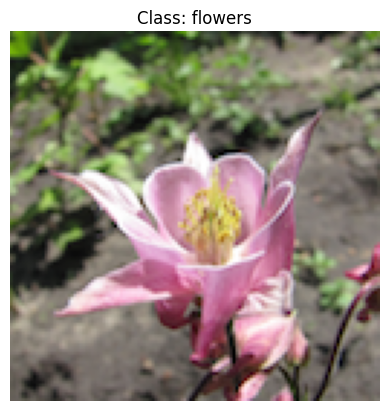

Displaying images for class: cats


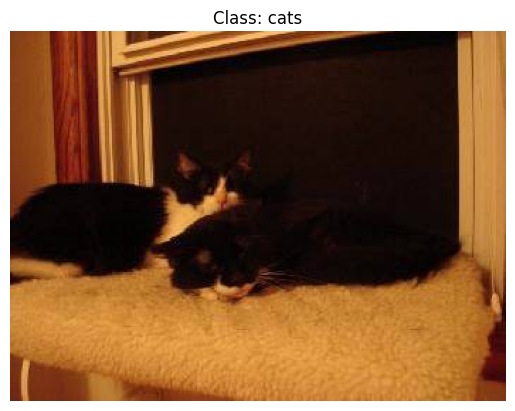

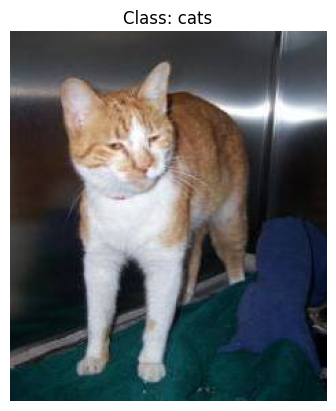

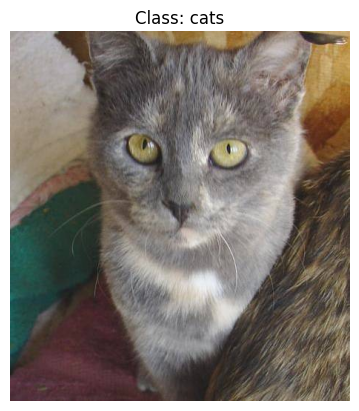

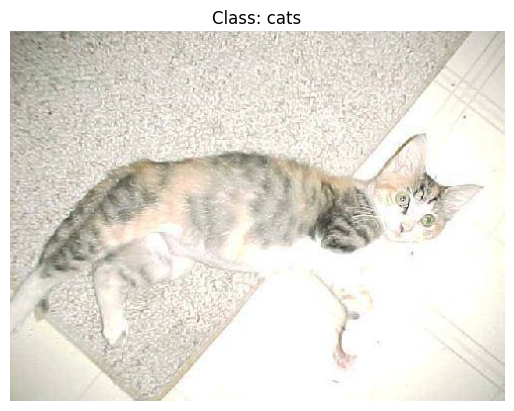

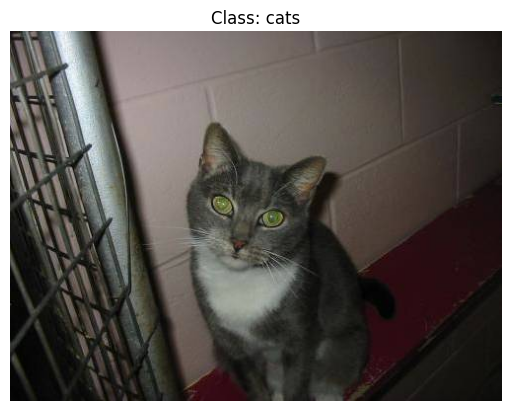

Displaying images for class: horses


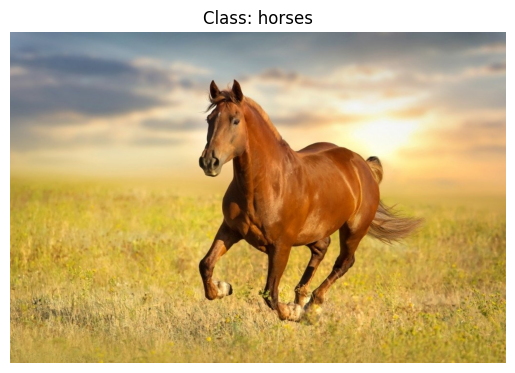

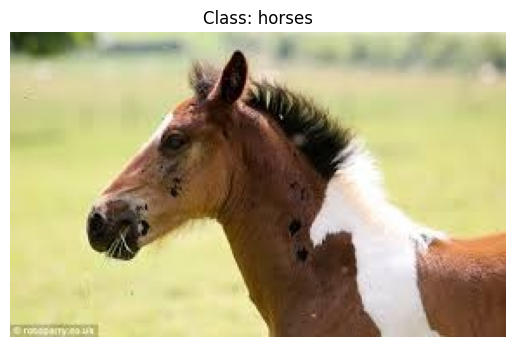

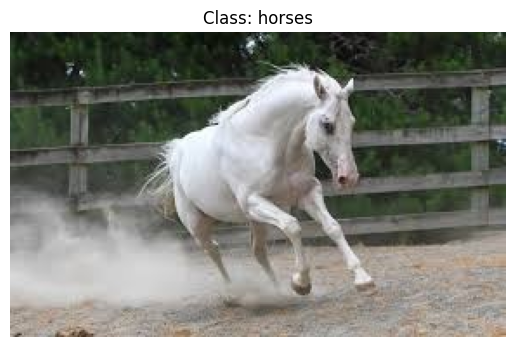

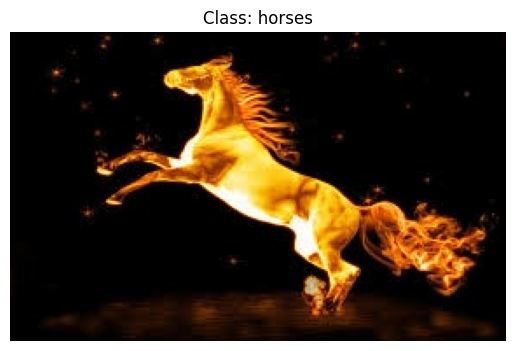

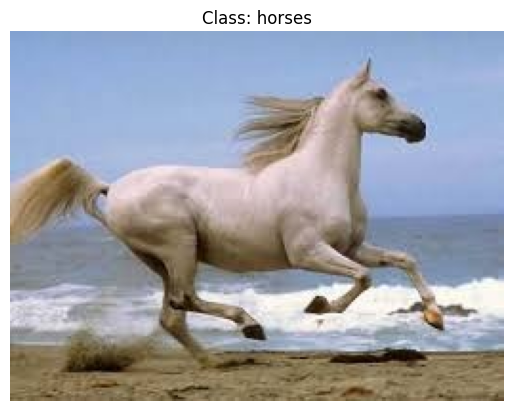

Displaying images for class: dogs


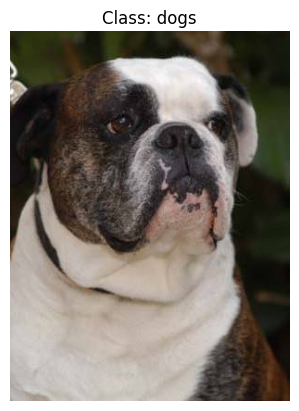

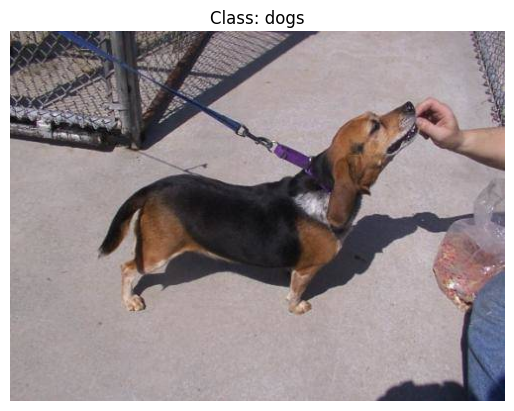

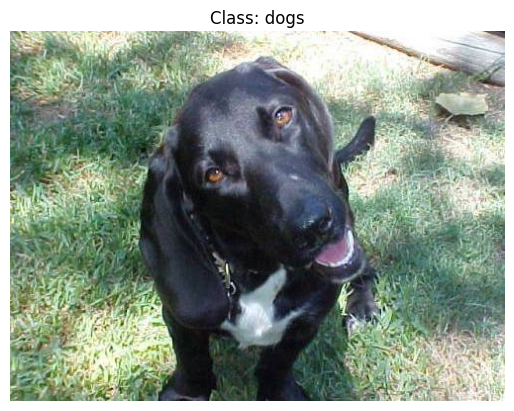

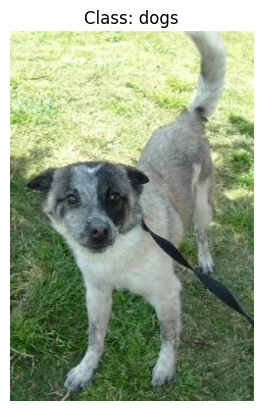

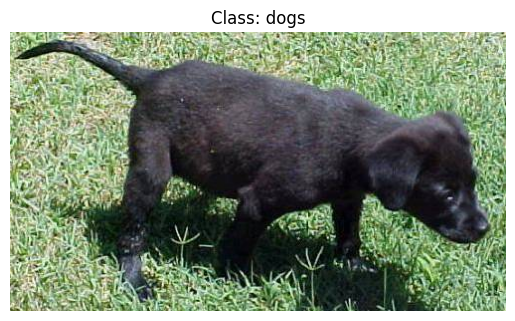

In [ ]:


# # Display images
display_images_from_dataset(dataset_path)


**CNN**

In [16]:
import pandas as pd

# Load the image data CSV
df = pd.read_csv('image_data.csv')

# Print the first few rows to understand its structure
print(df.head())


                                    image_path  label
0   images_dataset_new/data/human/rider-23.jpg  human
1  images_dataset_new/data/human/rider-176.jpg  human
2  images_dataset_new/data/human/rider-104.jpg  human
3  images_dataset_new/data/human/rider-140.jpg  human
4  images_dataset_new/data/human/rider-167.jpg  human


# New

In [79]:
import pandas as pd
import os

# Define the data directory
data_dir = 'images_dataset_new/data'

# Initialize lists to store file paths and labels
filepaths = []
labels = []

# Generate file paths and labels
folds = os.listdir(data_dir)
for fold in folds:
    foldpath = os.path.join(data_dir, fold)
    filelist = os.listdir(foldpath)
    for file in filelist:
        fpath = os.path.join(foldpath, file)
        filepaths.append(fpath)
        labels.append(fold)

# Create DataFrame
df = pd.DataFrame({'filepaths': filepaths, 'labels': labels})

# Check DataFrame columns
print(df.columns)

# Print first few rows of the DataFrame
print(df.head())



Index(['filepaths', 'labels'], dtype='object')
                                     filepaths labels
0   images_dataset_new/data/human/rider-23.jpg  human
1  images_dataset_new/data/human/rider-176.jpg  human
2  images_dataset_new/data/human/rider-104.jpg  human
3  images_dataset_new/data/human/rider-140.jpg  human
4  images_dataset_new/data/human/rider-167.jpg  human


In [80]:
print(df.columns)


Index(['filepaths', 'labels'], dtype='object')


In [81]:
# Print the first few rows to inspect the DataFrame
print(df.head())


                                     filepaths labels
0   images_dataset_new/data/human/rider-23.jpg  human
1  images_dataset_new/data/human/rider-176.jpg  human
2  images_dataset_new/data/human/rider-104.jpg  human
3  images_dataset_new/data/human/rider-140.jpg  human
4  images_dataset_new/data/human/rider-167.jpg  human


In [82]:
min_samples = 2
class_counts = dummy_df['labels'].value_counts()
classes_to_keep = class_counts[class_counts >= min_samples].index
filtered_df = dummy_df[dummy_df['labels'].isin(classes_to_keep)]


In [83]:
print(filtered_df['labels'].value_counts())

labels
cars       84
bike       73
flowers    42
dogs       41
horses     41
cats       40
human      40
Name: count, dtype: int64


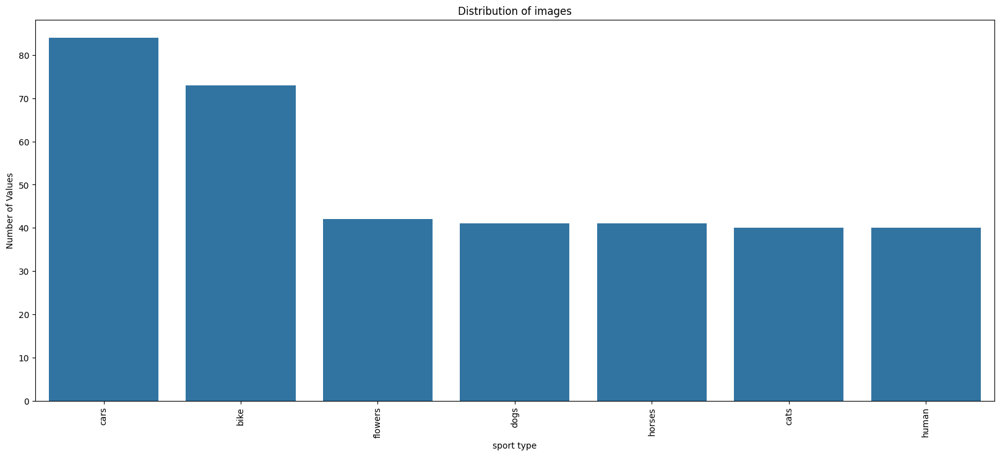

In [84]:
import seaborn as sns
class_counts = filtered_df['labels'].value_counts()
plt.figure(figsize=(20, 8))
sns.barplot(x=class_counts.index, y=class_counts.values)

plt.xlabel('sport type')
plt.ylabel('Number of Values')
plt.title('Distribution of images')
plt.xticks(rotation=90)
plt.show()  # Display the plot

In [85]:
from sklearn.model_selection import train_test_split

colname = filtered_df['labels']
valid_df, test_df = train_test_split(
    filtered_df,
    train_size=0.5,
    shuffle=True,
    random_state=123,
    stratify=colname
)


In [86]:
batch_size = 16
img_size = (224, 224)
channels = 3
img_shape = (img_size[0], img_size[1], channels)

In [87]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
tr_gen = ImageDataGenerator()
ts_gen = ImageDataGenerator()


In [88]:
# Training Generator (train_gen)
train_gen = tr_gen.flow_from_dataframe(
    train_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)


Found 1442 validated image filenames belonging to 7 classes.


/usr/local/lib/python3.10/dist-packages/keras/src/legacy/preprocessing/image.py:920: UserWarning: Found 6 invalid image filename(s) in x_col="filepaths". These filename(s) will be ignored.
  warnings.warn(


In [89]:
valid_gen = ts_gen.flow_from_dataframe(
    valid_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=True,
    batch_size=batch_size
)


Found 180 validated image filenames belonging to 7 classes.


In [90]:
test_gen = ts_gen.flow_from_dataframe(
    test_df,
    x_col='filepaths',
    y_col='labels',
    target_size=img_size,
    class_mode='categorical',
    color_mode='rgb',
    shuffle=False,
    batch_size=batch_size
)


Found 181 validated image filenames belonging to 7 classes.


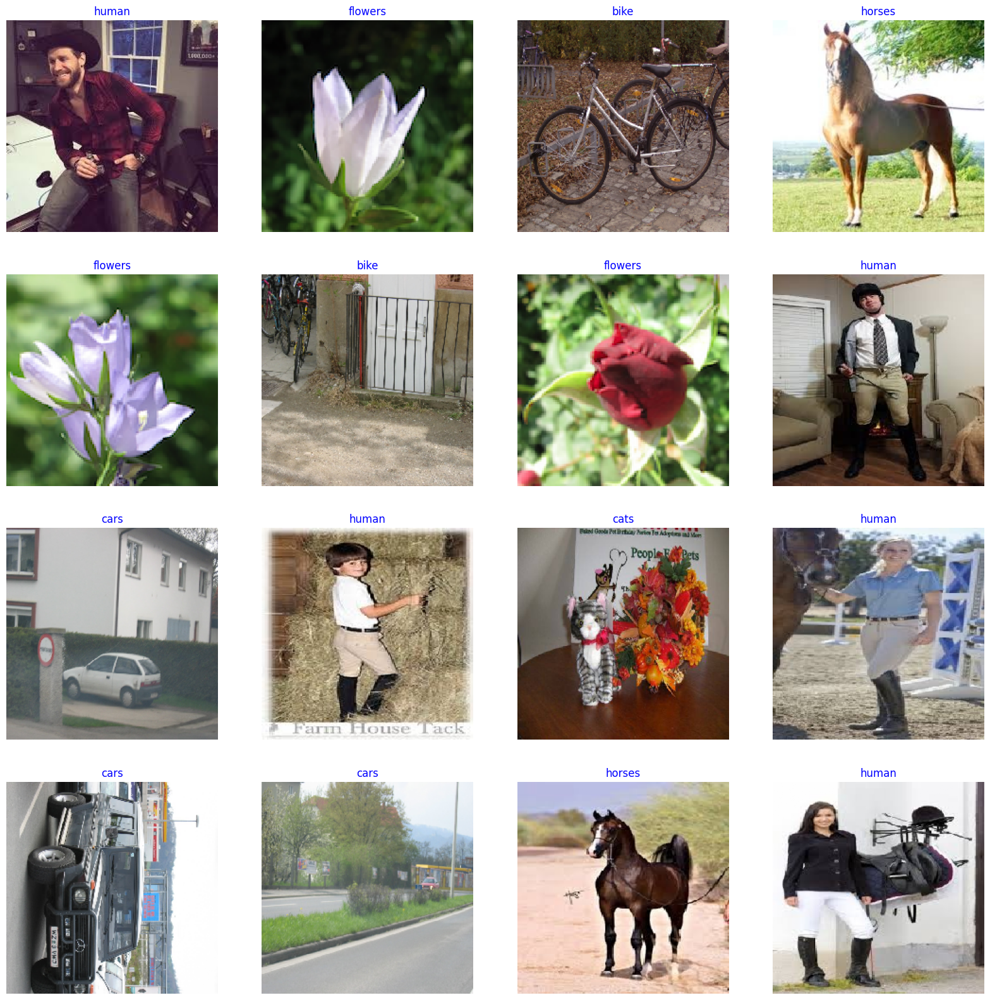

In [91]:

g_dict = train_gen.class_indices     # defines dictionary {'class': index}
classes = list(g_dict.keys())       # defines list of dictionary's kays (classes), classes names : string
images, labels = next(train_gen)      # get a batch size samples from the generator

plt.figure(figsize= (20, 20))

for i in range(16):
    plt.subplot(4, 4, i + 1)
    image = images[i] / 255       # scales data to range (0 - 255)
    plt.imshow(image)
    index = np.argmax(labels[i])  # get image index
    class_name = classes[index]   # get class of image
    plt.title(class_name, color= 'blue', fontsize= 12)
    plt.axis('off')
plt.show()

In [92]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import regularizers
from tensorflow.keras.layers import InputLayer, BatchNormalization, Dense, Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adamax

# Define class_count
class_count = len(train_gen.class_indices)  # Number of classes in your dataset

# Load base model
base_model = VGG16(weights='imagenet', include_top=False, input_shape=img_shape)

# Build model
model1 = Sequential([
    InputLayer(input_shape=img_shape),
    base_model,
    BatchNormalization(axis=-1, momentum=0.99, epsilon=0.001),
    Dense(128, kernel_regularizer=regularizers.l2(0.01), activity_regularizer=regularizers.l1(0.001),
          bias_regularizer=regularizers.l1(0.001), activation='relu'),
    Dropout(rate=0.4, seed=123),
    Dense(class_count, activation='softmax')
])

model1.compile(Adamax(learning_rate=0.01), loss='categorical_crossentropy', metrics=['accuracy'])

model1.summary()




/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/input_layer.py:26: UserWarning: Argument `input_shape` is deprecated. Use `shape` instead.
  warnings.warn(


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 7, 7, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 7, 7, 512)           │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 7, 7, 128)           │          65,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 7, 7, 7)             │             903 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,783,303 (56.39 MB)

 Trainable params: 14,782,279 (56.39 MB)

 Non-trainable params: 1,024 (4.00 KB)

In [93]:
model1.save('my_model.keras')